# <center> Python for Data Analysis</center>
### <center> Session 1d </center>

In [1]:
%%HTML
<style>
td,th {
  font-size: 20px
}
</style>


## <font color=green>Table of Contents</font>
- Quick Introduction to Pandas
- DataFrame and Series  
    - Series
    - DataFrame
- Loading Files
    - The NYC flights Dataset
- Getting a quick look at your data
- Filtering a DataFrame
- Sorting
- Selecting Multiple columns
- Renaming columns
- Rearranging columns
- Creating new columns
- Grouping in Pandas
- Merging in Pandas
- The Axis parameter
- [The Apply Function](#apply)
- [Working with Null Values](#Null)
- [Reshaping/Pivoting](#Pivot)

In [2]:
import pandas as pd
import numpy as np
import re
import altair as alt
import seaborn as sns
import matplotlib.pyplot as plt
import seaborn.objects as so
alt.data_transformers.disable_max_rows()
import matplotlib.pyplot as plt
print(f"Pandas:{pd.__version__}")
print(f"Altair:{alt.__version__}")
print(f"numpy:{np.__version__}")
print(f"seaborn:{sns.__version__}")

Pandas:2.1.4
Altair:5.2.0
numpy:1.23.5
seaborn:0.12.2


In [3]:
flights=pd.read_csv("https://github.com/niradsp/Python-for-Data-Analysis/raw/main/flights.csv.gz",compression="gzip",index_col=0)

In [4]:
flights_numeric=flights.select_dtypes(['int64','float64']).copy()

# <a id="apply"> Apply </a>  
I am going to now introduce a function called <b>apply() </b>, which allows you to apply a function along an axis (row or column), preferably using custom functions.
With apply(), you can use either a lambda(anonymous) function, or pass a custom function to it.  The apply() function appears to be slow--so use with caution.

In [6]:
def drop_na_sum(x):
    return x.dropna().sum()
flights_numeric.apply(drop_na_sum,axis=0)
#flights_numeric.apply(lambda x:x.dropna().sum(),axis=0)

year              677930088.0
month               2205381.0
day                 5291016.0
dep_time          443210949.0
sched_dep_time    452712768.0
dep_delay           4152200.0
arr_time          492768669.0
sched_arr_time    517415985.0
arr_delay           2257174.0
flight            664096549.0
air_time           49326610.0
distance          350217607.0
hour                4438791.0
minute              8833668.0
dtype: float64

And here, I am calculating rowsum of the top 20 rows using apply.

In [7]:
flights_numeric.iloc[1:20].apply(lambda x:x.dropna().sum(),axis=1)

1      8172.0
2      7340.0
3      7645.0
4      6132.0
5      7231.0
6      6687.0
7     10583.0
8      6014.0
9      5855.0
10     6101.0
11     6117.0
12     8039.0
13     9073.0
14     7414.0
15     6638.0
16     8678.0
17     6522.0
18    10441.0
19     6424.0
dtype: float64

Here is an example where I applied column-wise z-score normalization

In [9]:
def z_score_func(x):
    return (x-x.mean())/(x.std())
flights_numeric.drop(columns=['year','month','day']).dropna().apply(z_score_func,axis=0).head(n=3)

,dep_time,sched_dep_time,dep_delay,arr_time,sched_arr_time,arr_delay,flight,air_time,distance,hour,minute
0,-1.703371,-1.765751,-0.263446,-1.260879,-1.433370,0.091963,-0.245513,0.814547,0.477816,-1.746225,-0.582202
1,-1.670605,-1.735799,-0.213528,-1.223348,-1.411281,0.293606,-0.141290,0.814547,0.499558,-1.746225,0.143340
2,-1.652175,-1.712265,-0.263446,-1.086359,-1.371119,0.584869,-0.494661,0.099410,0.055209,-1.746225,0.713409


In [10]:
dep_time_std=flights_numeric.drop(columns=['year','month','day']).dropna().apply(z_score_func,axis=0).dep_time.std()
dep_time_mean=flights_numeric.drop(columns=['year','month','day']).dropna().apply(z_score_func,axis=0).dep_time.mean()
print(f"Departure time Mean is {dep_time_mean} and Standard Deviation is {dep_time_std}")

Departure time Mean is 4.697214813026146e-17 and Standard Deviation is 1.0000000000000149


While the Apply function applies a function rowwise or columnwise, the <b> map()</b> function applies a function element-wise. 

As an example, converting data to integer does not need to be performed rowwise or columnwise, but rather element-wise.
Here are a few rows of our flights_numeric object.  Notice that some columns are integers, and others are floats.

In [11]:
flights_numeric.iloc[1:10,:].head(n=3)

,year,month,day,dep_time,sched_dep_time,dep_delay,arr_time,sched_arr_time,arr_delay,flight,air_time,distance,hour,minute
1,2013,1,1,533.0,529,4.0,850.0,830,20.0,1714,227.0,1416,5,29
2,2013,1,1,542.0,540,2.0,923.0,850,33.0,1141,160.0,1089,5,40
3,2013,1,1,544.0,545,-1.0,1004.0,1022,-18.0,725,183.0,1576,5,45


<div class="alert alert-block alert-info"> Note that with an older version of Pandas, you may need to use applymap instead of map.  If you get an error message, use the commented line. </div>

Notice that the decimal point vanished after using the map lambda function.

In [12]:
flights_numeric.iloc[1:10,:].map(lambda x:int(x)).head(3)
#flights_numeric.dropna().applymap(lambda x:int(x)).head(3)

,year,month,day,dep_time,sched_dep_time,dep_delay,arr_time,sched_arr_time,arr_delay,flight,air_time,distance,hour,minute
1,2013,1,1,533,529,4,850,830,20,1714,227,1416,5,29
2,2013,1,1,542,540,2,923,850,33,1141,160,1089,5,40
3,2013,1,1,544,545,-1,1004,1022,-18,725,183,1576,5,45


Also note that if there is a specific value you want to replace, you can use the <b> replace() </b> method.

In [13]:
flights_numeric.replace(to_replace=517,value=0).head()

,year,month,day,dep_time,sched_dep_time,dep_delay,arr_time,sched_arr_time,arr_delay,flight,air_time,distance,hour,minute
0,2013,1,1,0.0,515,2.0,830.0,819,11.0,1545,227.0,1400,5,15
1,2013,1,1,533.0,529,4.0,850.0,830,20.0,1714,227.0,1416,5,29
2,2013,1,1,542.0,540,2.0,923.0,850,33.0,1141,160.0,1089,5,40
3,2013,1,1,544.0,545,-1.0,1004.0,1022,-18.0,725,183.0,1576,5,45
4,2013,1,1,554.0,600,-6.0,812.0,837,-25.0,461,116.0,762,6,0


# <a id="Null"> Working with NULL Values  </a>
There are some functions that allow us to work with Null values.  I will introduce them here.

First is the <b> fillna()</b> method. Suppose that you want to replace NULL values by the average of each column.  How can we go about doing this?
First, let's look at the flights_numeric DataFrame.

In [14]:
flights_numeric

,year,month,day,dep_time,sched_dep_time,dep_delay,arr_time,sched_arr_time,arr_delay,flight,air_time,distance,hour,minute
0,2013,1,1,517.0,515,2.0,830.0,819,11.0,1545,227.0,1400,5,15
1,2013,1,1,533.0,529,4.0,850.0,830,20.0,1714,227.0,1416,5,29
2,2013,1,1,542.0,540,2.0,923.0,850,33.0,1141,160.0,1089,5,40
3,2013,1,1,544.0,545,-1.0,1004.0,1022,-18.0,725,183.0,1576,5,45
4,2013,1,1,554.0,600,-6.0,812.0,837,-25.0,461,116.0,762,6,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
336771,2013,9,30,NaN,1455,NaN,NaN,1634,NaN,3393,NaN,213,14,55
336772,2013,9,30,NaN,2200,NaN,NaN,2312,NaN,3525,NaN,198,22,0
336773,2013,9,30,NaN,1210,NaN,NaN,1330,NaN,3461,NaN,764,12,10
336774,2013,9,30,NaN,1159,NaN,NaN,1344,NaN,3572,NaN,419,11,59


In [15]:
print(flights_numeric.dep_time.dropna().mean())
print(flights_numeric.arr_time.dropna().mean())
print(flights_numeric.dep_delay.dropna().mean())

1349.1099473093045
1502.0549985825894
12.639070257304708


We want to use the averages (like we see above) and impute the missing data.

In [16]:
flights_numeric.fillna(flights_numeric.mean())

,year,month,day,dep_time,sched_dep_time,dep_delay,arr_time,sched_arr_time,arr_delay,flight,air_time,distance,hour,minute
0,2013,1,1,517.000000,515,2.00000,830.000000,819,11.000000,1545,227.00000,1400,5,15
1,2013,1,1,533.000000,529,4.00000,850.000000,830,20.000000,1714,227.00000,1416,5,29
2,2013,1,1,542.000000,540,2.00000,923.000000,850,33.000000,1141,160.00000,1089,5,40
3,2013,1,1,544.000000,545,-1.00000,1004.000000,1022,-18.000000,725,183.00000,1576,5,45
4,2013,1,1,554.000000,600,-6.00000,812.000000,837,-25.000000,461,116.00000,762,6,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
336771,2013,9,30,1349.109947,1455,12.63907,1502.054999,1634,6.895377,3393,150.68646,213,14,55
336772,2013,9,30,1349.109947,2200,12.63907,1502.054999,2312,6.895377,3525,150.68646,198,22,0
336773,2013,9,30,1349.109947,1210,12.63907,1502.054999,1330,6.895377,3461,150.68646,764,12,10
336774,2013,9,30,1349.109947,1159,12.63907,1502.054999,1344,6.895377,3572,150.68646,419,11,59


In [17]:
flights_numeric.ffill().tail()

,year,month,day,dep_time,sched_dep_time,dep_delay,arr_time,sched_arr_time,arr_delay,flight,air_time,distance,hour,minute
336771,2013,9,30,2349.0,1455,-10.0,325.0,1634,-25.0,3393,196.0,213,14,55
336772,2013,9,30,2349.0,2200,-10.0,325.0,2312,-25.0,3525,196.0,198,22,0
336773,2013,9,30,2349.0,1210,-10.0,325.0,1330,-25.0,3461,196.0,764,12,10
336774,2013,9,30,2349.0,1159,-10.0,325.0,1344,-25.0,3572,196.0,419,11,59
336775,2013,9,30,2349.0,840,-10.0,325.0,1020,-25.0,3531,196.0,431,8,40


To see what is going on, I will show the last couple of rows after dropping null values.
As you can see, the last non-null value for dep_time is 2349. This value is what dep_time got filled with.

In [18]:
flights_numeric.dropna().tail(n=2)

,year,month,day,dep_time,sched_dep_time,dep_delay,arr_time,sched_arr_time,arr_delay,flight,air_time,distance,hour,minute
336768,2013,9,30,2307.0,2255,12.0,2359.0,2358,1.0,718,33.0,187,22,55
336769,2013,9,30,2349.0,2359,-10.0,325.0,350,-25.0,745,196.0,1617,23,59


Similarly, there is also the <b> bfill() </b> function.

# <a id="Pivot"> Pivoting/Reshaping</a>

You may want to change the shape of the data depending on what you want to do.
As an example, when you want to plot something, you will want "x" and "y" columns.  The data may not be provided that way. So you will want to reshape the data.  Let's use the df1 dataframe from session 1c.  Let's recreate the dataframes.

In [19]:
df1=pd.DataFrame({"category1":["a","b","c","d"],"value":[1,2,3,4]})

In [20]:
df2=pd.DataFrame({"category2":["a","c","d","e"],"value":[1,2,3,4]})

In [21]:
df1

,category1,value
0,a,1
1,b,2
2,c,3
3,d,4


The first thing you may want to do is <b> transpose </b> the data (row becomes column, and column becomes row).
All you need to do is use the .T attribute.

In [22]:
df1.T

,0,1,2,3
category1,a,b,c,d
value,1,2,3,4


If you want to perform tasks such as the dot product, the transpose might need to be performed.

However, programs such as Numpy might be better suited for this purpose.  In any event, here is a quick example.  We are going to create 2 dataframes, a and b, and then perform a dot product, after transposing one of the dataframes.

In [23]:
a=pd.DataFrame([[2,2],[3,3]])
a.head()

,0,1
0,2,2
1,3,3


In [24]:
b=pd.DataFrame([[4,4],[5,5]])
b.head()

,0,1
0,4,4
1,5,5


In [25]:
a.T

,0,1
0,2,3
1,2,3


Pandas allows you to do a dot product.  Note that this may be more efficient in packages such as Numpy.

In [26]:
a.T.dot(b)

,0,1
0,23,23
1,23,23


You can also use the <b>@ </b> notation.

In [27]:
a.T@b

,0,1
0,23,23
1,23,23


<b> Back to talking about Pivoting/Reshaping </b>

To discuss this aspect of Pandas, let's create a "fake" gene expression dataset, where 4 samples are KO and 4 samples are CTL.

I use the numpy random.randint() function, where in case of the Control, the values range from 1000 to 2000.  
The Dimension is 20000x5.
We create a KO dataframe.  Then we concatenate then column-wise (cbind in R).

In [28]:
np.random.seed(1)
gene_CTL=pd.DataFrame(np.random.randint(1000,2000,size=(20000,5)))
gene_KO=pd.DataFrame(np.random.randint(1500,5000,size=(20000,5)))
gene_data=pd.concat([gene_CTL,gene_KO],axis=1)
gene_data.columns=["CTL"+str(i) if i<5 else "KO"+str(i) for i in range(len(gene_data.columns))]
gene_data['gene']=["gene"+str(i) for i in range(gene_data.shape[0])]

In [29]:
gene_data.head()

,CTL0,CTL1,CTL2,CTL3,CTL4,KO5,KO6,KO7,KO8,KO9,gene
0,1037,1235,1908,1072,1767,1954,2916,3942,2300,1770,gene0
1,1905,1715,1645,1847,1960,2217,4369,2701,3682,2442,gene1
2,1144,1129,1972,1583,1749,4972,2974,2749,4652,4592,gene2
3,1508,1390,1281,1178,1276,3088,3403,2669,3517,2396,gene3
4,1254,1357,1914,1468,1907,2030,3668,2538,2504,2102,gene4


Let's use the filter() method to grab columns starting with either CTL or KO.

In [30]:
gene_list=gene_data.filter(regex="CTL|KO").columns.tolist()

We can use the pandas <b> melt</b> method to convert this data from <b> wide </b> to <b> long</b> format.  The melt method requires the <b> id_vars </b> parameter, which in this example is the gene column.   The <b> value_vars </b> parameter  will be all columns starting with CTL or KO (i.e. the Expression data). We grabbed those columns above in the gene_list variable.

In [31]:
genes_melted=pd.melt(gene_data,id_vars="gene",value_vars=gene_list)

In [32]:
genes_melted.head()

,gene,variable,value
0,gene0,CTL0,1037
1,gene1,CTL0,1905
2,gene2,CTL0,1144
3,gene3,CTL0,1508
4,gene4,CTL0,1254


In [33]:
genes_melted.shape

(200000, 3)

Let's create a new column called "Condition", which will remove the digit from the variable column.  Thus the condition column will have "CTL" and "KO" only without the digit(s).  
To achieve this, let's remove digits from the variable column using replace.  The way to do this is using the replace() function in pandas, and set regex=True.  The \d represents digit. \d+ means 1 or more digits.

In [34]:
genes_melted['condition']=genes_melted.variable.replace('\d+','',regex=True)

In [35]:
genes_melted.head()

,gene,variable,value,condition
0,gene0,CTL0,1037,CTL
1,gene1,CTL0,1905,CTL
2,gene2,CTL0,1144,CTL
3,gene3,CTL0,1508,CTL
4,gene4,CTL0,1254,CTL


In [36]:
genes_melted.groupby("variable")['value'].mean()

variable
CTL0    1500.64880
CTL1    1497.51610
CTL2    1501.18935
CTL3    1499.66795
CTL4    1502.38830
KO5     3263.93870
KO6     3240.54215
KO7     3248.34565
KO8     3249.56375
KO9     3245.38925
Name: value, dtype: float64

This example demonstrates that the long-format is required in Altair to generate boxplots.

In [37]:
alt.Chart(genes_melted).encode(alt.X("variable"),
                              alt.Y("value",scale=alt.Scale(zero=False)),
                              alt.Color("condition"),
                              ).mark_boxplot().properties(width=500,height=500)

alt.Chart(...)

Let's look at the long-form data one more time as reference.

In [38]:
genes_melted.head()

,gene,variable,value,condition
0,gene0,CTL0,1037,CTL
1,gene1,CTL0,1905,CTL
2,gene2,CTL0,1144,CTL
3,gene3,CTL0,1508,CTL
4,gene4,CTL0,1254,CTL


The <b>pivot</b> method can be used to convert from <b>long</b> to <b>wide</b> format.  
Among the parameters that it accepts are the columns parameter, which has the categories that will form the column.
The next parameter that we want to set is the "index" parameter.  We will use the "gene" column.  This will not be converted to column.
Finally, the "expression values" can be found in the "value" column.

In [39]:
genes_wide=pd.pivot(genes_melted,columns="variable",index="gene",values="value").reset_index()

In [40]:
genes_wide.head(3)

variable,gene,CTL0,CTL1,CTL2,CTL3,CTL4,KO5,KO6,KO7,KO8,KO9
0,gene0,1037,1235,1908,1072,1767,1954,2916,3942,2300,1770
1,gene1,1905,1715,1645,1847,1960,2217,4369,2701,3682,2442
2,gene10,1264,1728,1653,1627,1431,3926,4743,4051,4563,2719


The shape attribute below shows that the data is now 20000x11 in size.

In [41]:
genes_wide.shape

(20000, 11)

The Pandas boxplot method can use data in wide format to generate a boxplot.  Unlike Altair's boxplot, a wide format works fine here.

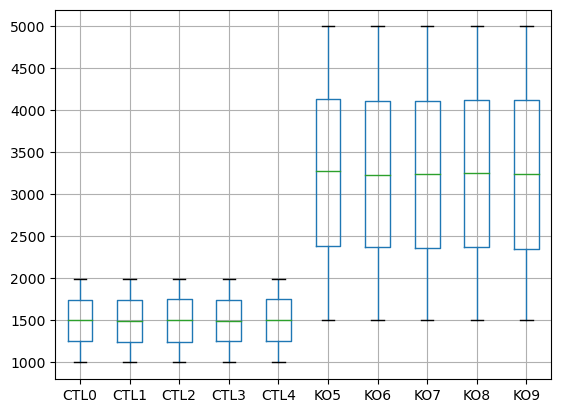

In [42]:
genes_wide.boxplot(column=[j for j in genes_wide.columns if j not in ("gene","")])
plt.show()

The pivot_table() function can be used for aggregation.  In this example, for each condition, the expression level was average.

Here, I use the dataset in long format, and then using pivot_table, I convert to wide format.  Here I calculate the mean for each condition.  So now for each gene, we have only 2 columns: CTL and KO.

In [43]:
genes_melted.pivot_table(values="value",index="gene",columns="condition",aggfunc="mean").head()

condition,CTL,KO
gene,,
gene0,1403.8,2576.4
gene1,1814.4,3082.2
gene10,1540.6,4000.4
gene100,1405.6,2599.0
gene1000,1471.0,3097.2


And here is the boxplot.  We specify "CTL" and "KO" as the columns of interest.

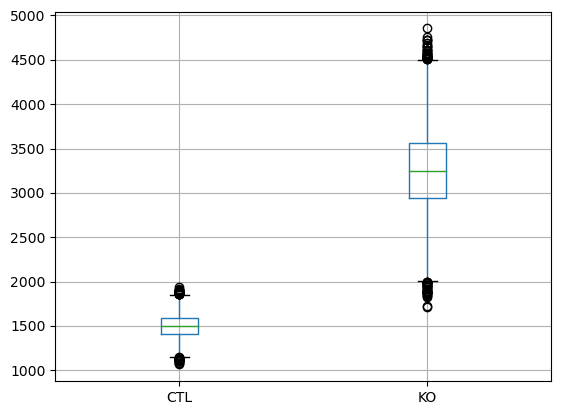

In [44]:
genes_melted.pivot_table(values="value",index="gene",columns="condition",aggfunc="mean").boxplot(column=["CTL","KO"])
plt.show()

Similarly, the unstack() method can also be used for converting long format to wide format.
By default it generates multi-index columns.  So you may want to parse the data a bit more.

In [45]:
genes_melted.set_index(["gene","variable"]).drop("condition",axis=1).unstack()

value                                                      
variable  CTL0  CTL1  CTL2  CTL3  CTL4   KO5   KO6   KO7   KO8   KO9
gene                                                                
gene0     1037  1235  1908  1072  1767  1954  2916  3942  2300  1770
gene1     1905  1715  1645  1847  1960  2217  4369  2701  3682  2442
gene10    1264  1728  1653  1627  1431  3926  4743  4051  4563  2719
gene100   1093  1164  1621  1302  1848  2343  2428  2282  4329  1613
gene1000  1786  1598  1029  1419  1523  3699  2056  1658  4261  3812
...        ...   ...   ...   ...   ...   ...   ...   ...   ...   ...
gene9995  1060  1136  1878  1101  1161  4108  2414  4235  2981  1611
gene9996  1158  1412  1233  1729  1799  2955  4610  3911  4251  3682
gene9997  1241  1917  1059  1459  1486  3314  3534  1750  3125  4608
gene9998  1287  1142  1150  1244  1481  4947  4674  2613  4447  4062
gene9999  1316  1666  1699  1314  1842  3334  2502  2187  4222  2104

[20000 rows x 10 columns]

Which means, obviously, that there is also the stack() method available. By default, it returns a multi-level index.

In [46]:
genes_wide.set_index("gene").stack()

gene      variable
gene0     CTL0        1037
          CTL1        1235
          CTL2        1908
          CTL3        1072
          CTL4        1767
                      ... 
gene9999  KO5         3334
          KO6         2502
          KO7         2187
          KO8         4222
          KO9         2104
Length: 200000, dtype: int32

You can use reset_index and some other functions to generate a dataframe that looks like follows.

In [47]:
genes_wide.set_index("gene").stack().reset_index().rename(columns={"variable":"Condition",0:"Expression"})

,gene,Condition,Expression
0,gene0,CTL0,1037
1,gene0,CTL1,1235
2,gene0,CTL2,1908
3,gene0,CTL3,1072
4,gene0,CTL4,1767
...,...,...,...
199995,gene9999,KO5,3334
199996,gene9999,KO6,2502
199997,gene9999,KO7,2187
199998,gene9999,KO8,4222


The <b> crosstab method() </b> is similar to table in R.  

In [48]:
pd.crosstab(genes_melted['variable'],genes_melted['condition'])

condition,CTL,KO
variable,,
CTL0,20000,0
CTL1,20000,0
CTL2,20000,0
CTL3,20000,0
CTL4,20000,0
KO5,0,20000
KO6,0,20000
KO7,0,20000
KO8,0,20000
